Features Information:

1. Area (A): The area of a bean zone and the number of pixels within its boundaries.
2. Perimeter (P): Bean circumference is defined as the length of its border.
3. Major axis length (L): The distance between the ends of the longest line that can bedrawn from a bean.
4. Minor axis length (l): The longest line that can be drawn from the bean whilestanding perpendicular to the main axis.
5. Aspect ratio (K): Defines the relationship between L and l.
6. Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.
7. Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
8. Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.
9. Extent (Ex): The ratio of the pixels in the bounding box to the bean area.
10. Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
11. Roundness (R): Calculated with the following formula: (4piA)/(P^2)
12. Compactness (CO): Measures the roundness of an object: Ed/L
13. ShapeFactor1 (SF1)
14. ShapeFactor2 (SF2)
15. ShapeFactor3 (SF3)
16. ShapeFactor4 (SF4)
17. Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

In [1]:
import numpy as np
import pandas as pd
%matplotlib inline

In [2]:
import matplotlib.pyplot
import seaborn as sns

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
df = pd.read_csv("F:\Data science\Practice dataset\data.csv")
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [6]:
df.shape

(13611, 17)

In this dataset, 13611 rows and 17 columns.

In [7]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [8]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


Here we can see except "Class" column all other columns are continuous values.

so class column our target variable.

There are no "NULL" values.

### Categorical column

Class

### Numerical Columns

Area

Perimeter

MajorAxisLength

MinorAxisLength

AspectRation

Eccentricity

ConvexArea

EquivDiameter

Extent

Solidity

roundness

Compactness

ShapeFactor1

ShapeFactor2

ShapeFactor3

ShapeFactor4

### Target variable 

In [9]:
df['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [10]:
df['Class'].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

There are 7 unique types of beans in "Class" Column

DERMASON most often appears in our dataset.

BOMBAY occurs the least amount of times in dataset.

In [11]:
#pip install pandas_profiling

In [12]:
import pandas_profiling

In [13]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

After observing profiling report we can identitfy that four columns("Area", "Perimeter", "ConvexArea", "EquivDiameter") have outliers.

We confirm the presence of outliers present in these columns by the help of box plot and do necessary action to treat them.

This report shows the result before doing preprocessing with the dataset. 

### EDA

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [15]:
# Univariate analysis

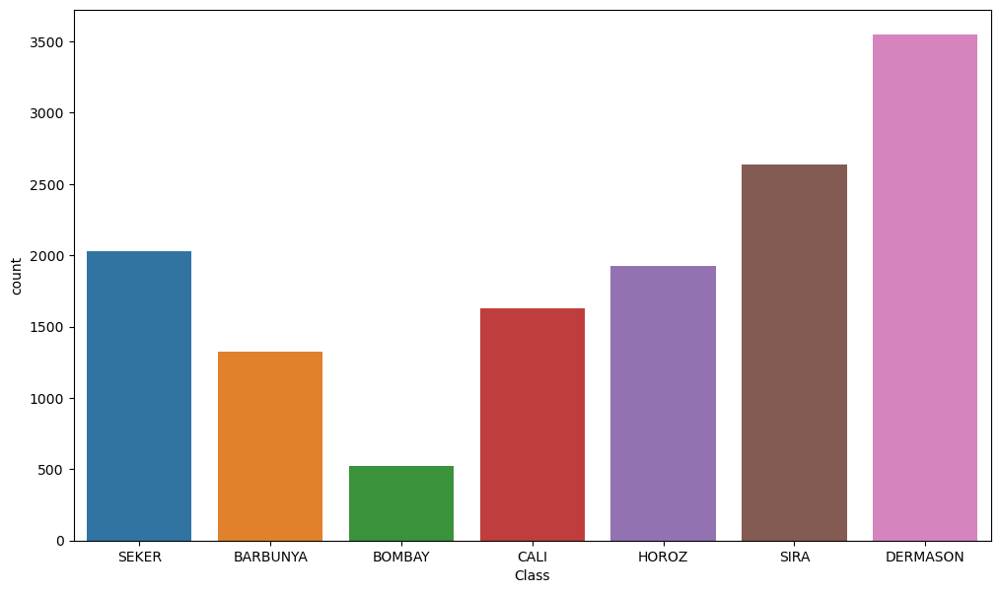

In [16]:
# bar chart
plt.figure(figsize=(12,7))
sns.countplot(x='Class', data=df)
plt.show()

DERMASON    26.052458
SIRA        19.366689
SEKER       14.892366
HOROZ       14.165014
CALI        11.975608
BARBUNYA     9.712732
BOMBAY       3.835133
Name: Class, dtype: float64


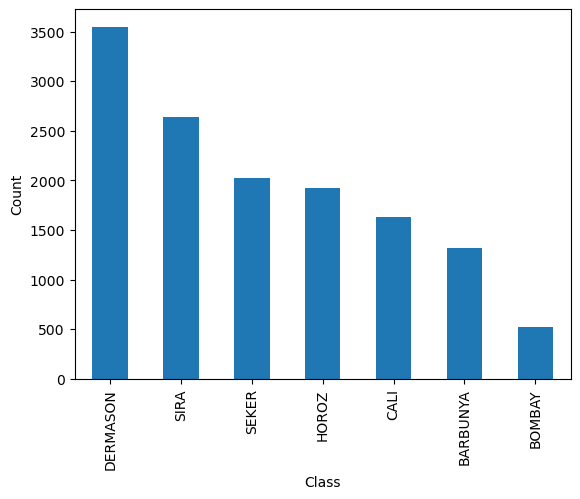

In [17]:
print((df['Class'].value_counts()/13611)*100) 
df['Class'].value_counts().plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

It creates a bar plot to visualize the distribution of the different bean classes in the dataset.

2.9529309714284606
10.800813973816409


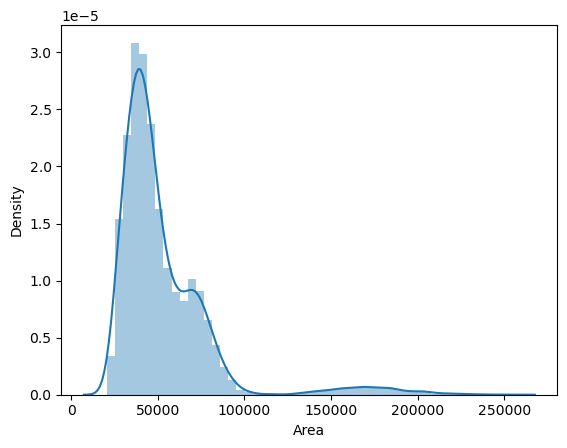

In [18]:
# Class column 
sns.distplot(df['Area'])

print(df['Area'].skew())

print(df['Area'].kurt())

The value printed will indicate the skewness of the 'Area' column. If the skewness is close to 0, it suggests that the distribution is approximately symmetric. A negative skewness value indicates a longer left tail, while a positive skewness value indicates a longer right tail.

Kurtosis is a measure of the shape of the distribution of values in the column, specifically focusing on the tails and outliers. If the kurtosis is close to 0, it suggests a normal distribution. Positive kurtosis indicates a distribution with heavier tails and a sharper peak, while negative kurtosis indicates a distribution with lighter tails and a flatter peak.

<Axes: >

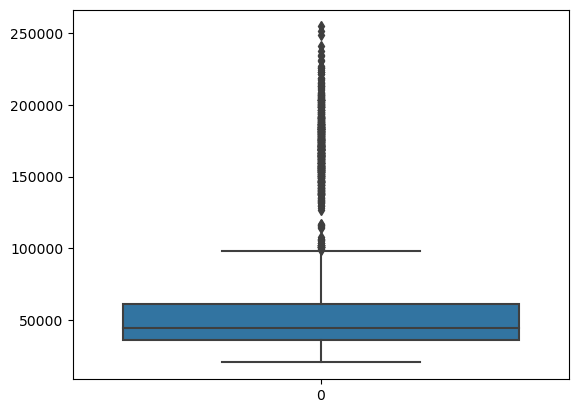

In [19]:
# cheking outliers with the help of boxplot.
sns.boxplot(df['Area'])

By observing above two graphs, it is clearly visible that outliers present in the "Area" column and data is right skewed.

1.6261235244866201
3.5881233266325765


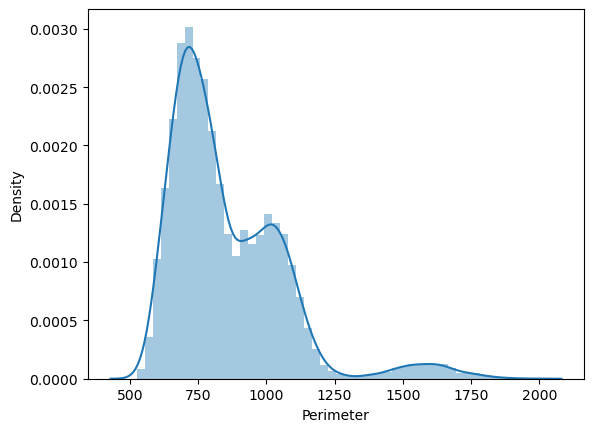

In [20]:
# Perimeter column 
sns.distplot(df['Perimeter'])

print(df['Perimeter'].skew())

print(df['Perimeter'].kurt())

<Axes: >

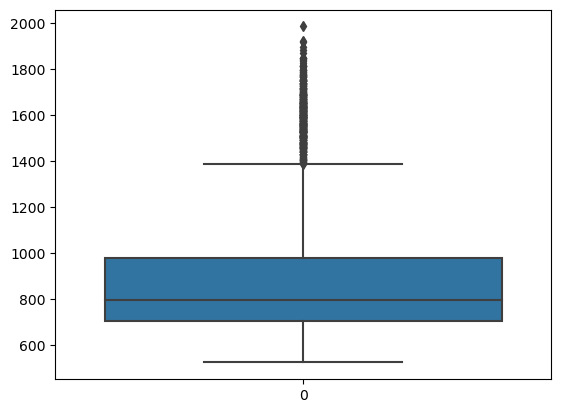

In [21]:
# cheking outliers with the help of boxplot.
sns.boxplot(df['Perimeter'])

In this column we clearly see that outliers present.

2.9418211110165506
10.743640152020804


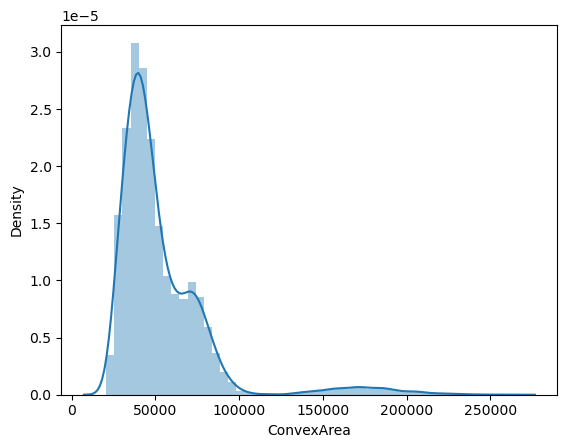

In [22]:
# ConvexArea column 
sns.distplot(df['ConvexArea'])

print(df['ConvexArea'].skew())

print(df['ConvexArea'].kurt())

<Axes: >

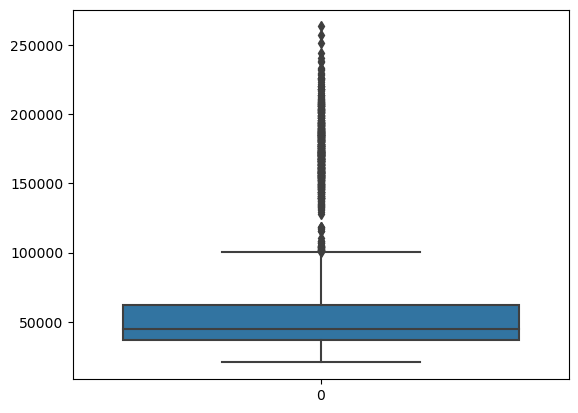

In [23]:
# cheking outliers with the help of boxplot.
sns.boxplot(df['ConvexArea'])

In 'ConvexArea' column outliers are present.

1.9489576094878978
5.19205725598947


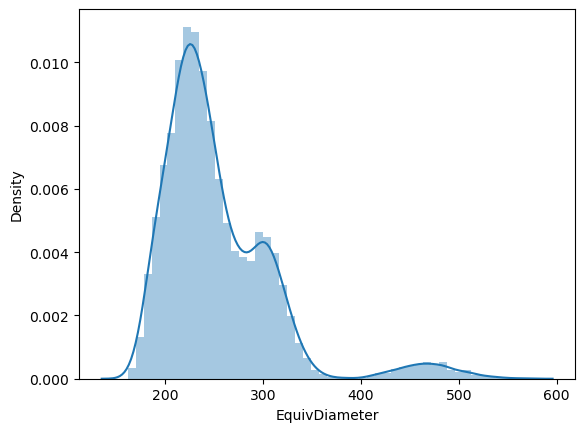

In [24]:
# ConvexArea column 
sns.distplot(df['EquivDiameter'])

print(df['EquivDiameter'].skew())

print(df['EquivDiameter'].kurt())

<Axes: >

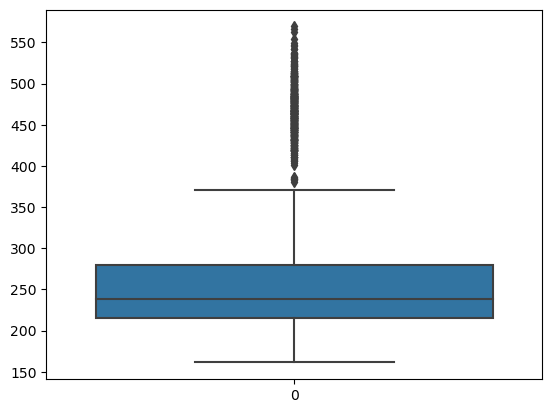

In [25]:
# cheking outliers with the help of boxplot.
sns.boxplot(df['EquivDiameter'])

In this column outliers are present.

### Treatment of Outliers

In [26]:
# handling outliers from 'Area', 'Perimeter', 'ConvexArea' & 'EquivDiameter' column

# find IQR

Q1 = np.percentile(df[['Area', 'Perimeter', 'ConvexArea', 'EquivDiameter']],25)
Q3 = np.percentile(df[['Area', 'Perimeter', 'ConvexArea', 'EquivDiameter']],75)

outlier_low = Q1-1.5 * (Q3 - Q1)
outlier_high = Q1+1.5 * (Q3 - Q1)

df = df[(df['Area'] > outlier_low) & (df['Area'] < outlier_high) &
        (df['Perimeter'] > outlier_low) & (df['Perimeter'] < outlier_high) &
        (df['ConvexArea'] > outlier_low) & (df['ConvexArea'] < outlier_high) &
        (df['EquivDiameter'] > outlier_low) & (df['EquivDiameter'] < outlier_high)]

<Axes: >

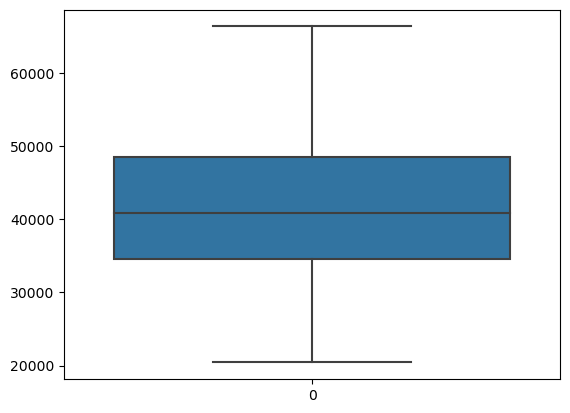

In [27]:
# After treatment of  outliers, we can check whether outliers present or not, with the help of boxplot.
sns.boxplot(df['Area'])

<Axes: >

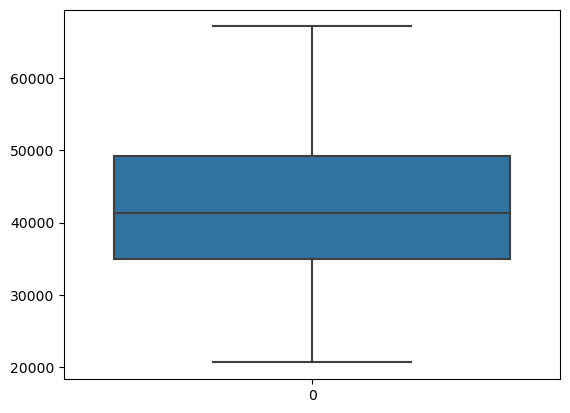

In [28]:
sns.boxplot(df['ConvexArea'])

<Axes: >

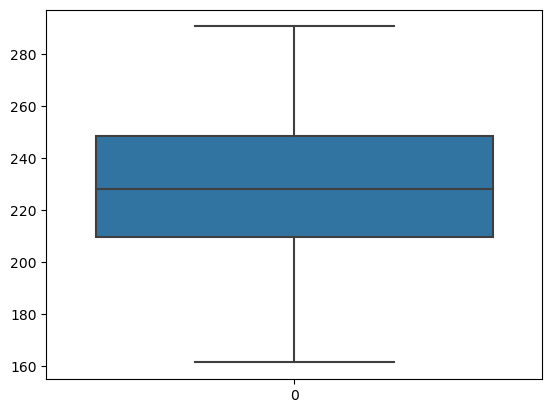

In [29]:
sns.boxplot(df['EquivDiameter'])

So above boxplot we can observe that outliers were removed from these columns. 
And now data is ready for the modeling.

In [30]:
# Using heat map, we can check the correlation between the two variables.

Text(0.5, 1.0, 'Correlation Heatmap')

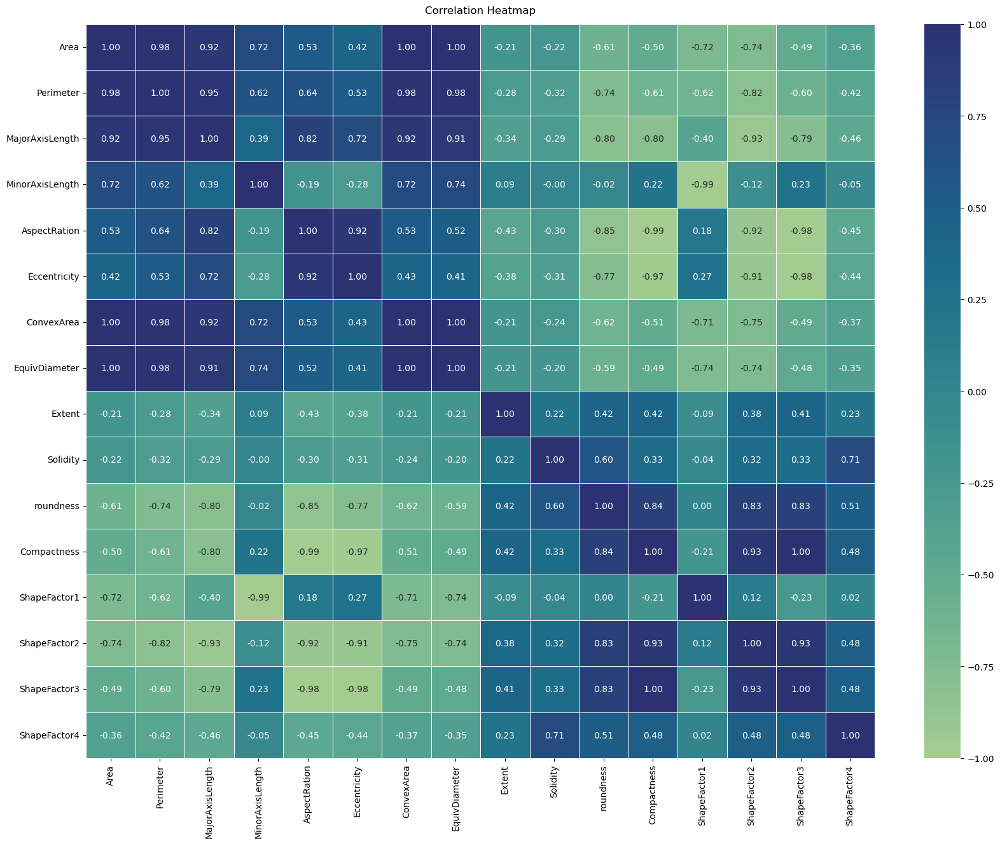

In [31]:
plt.figure(figsize=(20,15))
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, fmt=".2f", linewidth=.5, cmap="crest")
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Observations:

-1 : indicates a perfect negative correlation

1 : indicates a perfect positive correlation 

0 : indicates no correlation

### Modeling

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler

In [33]:
# Separating features and target variable

In [34]:
X = df.drop('Class', axis=1)   
y = df['Class']

In [35]:
#Convert the categorical target variable to numerical labels using LabelEncoder.
# because class contain data into string. 

In [36]:
le = LabelEncoder()
y = le.fit_transform(y)


In [37]:
y

array([4, 4, 4, ..., 2, 2, 2])

In [38]:
# split the dataset into training and testing.

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [39]:
# Standardizing features
scaler_X = preprocessing.StandardScaler().fit(X_train)
X_train_scaled = scaler_X.transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

In [40]:
# Initialize the Decision Tree Classifier 

clf = DecisionTreeClassifier()

In [41]:
# now train the data

clf.fit(X_train_scaled, y_train)


DecisionTreeClassifier()

In [42]:
# making prediction on the test data.

y_pred = clf.predict(X_test_scaled)

In [43]:
y_pred

array([2, 5, 2, ..., 4, 3, 2])

### Testing

In [44]:
# calculating the accuracy of the classifier.

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.8904428904428905


In [45]:
from sklearn.metrics import classification_report
print('Accuracy: %.5f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=np.unique(le.inverse_transform(y))))


Accuracy: 0.89044
              precision    recall  f1-score   support

    BARBUNYA       0.80      0.81      0.80        84
        CALI       0.60      0.44      0.51        41
    DERMASON       0.91      0.90      0.91       722
       HOROZ       0.94      0.95      0.94       377
       SEKER       0.93      0.91      0.92       406
        SIRA       0.83      0.86      0.84       515

    accuracy                           0.89      2145
   macro avg       0.84      0.81      0.82      2145
weighted avg       0.89      0.89      0.89      2145



In [46]:
# Import confusion metrix

In [47]:
from sklearn.metrics import confusion_matrix 

In [48]:
confusion_matrix(y_test, y_pred)

array([[ 68,   2,   0,   1,   2,  11],
       [  9,  18,   0,   9,   2,   3],
       [  0,   0, 653,   0,  14,  55],
       [  1,   6,   2, 360,   0,   8],
       [  5,   0,  20,   0, 370,  11],
       [  2,   4,  45,  15,   8, 441]], dtype=int64)

To understand this matrix we again draw the matrix with specifications.

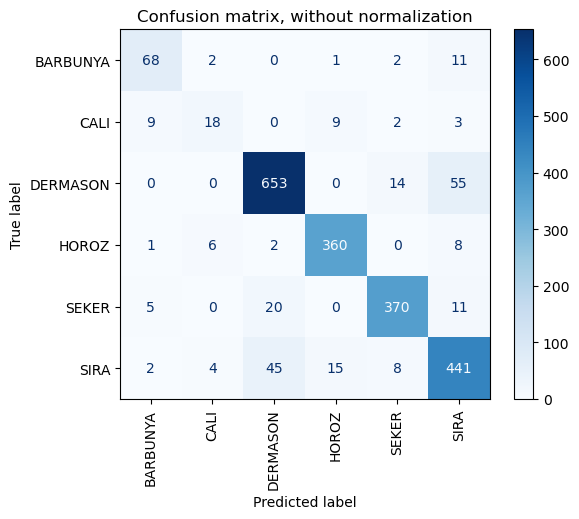

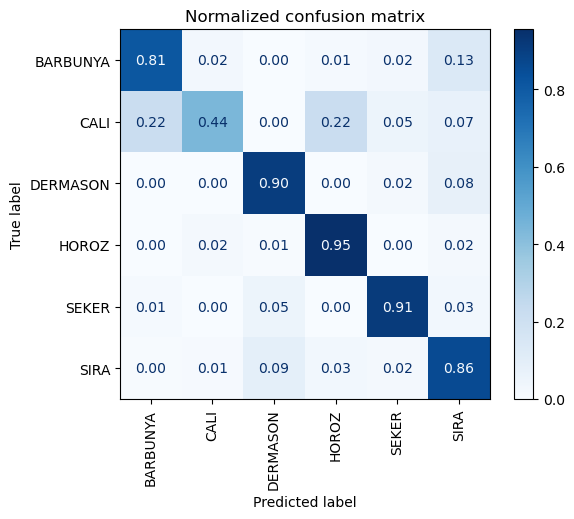

In [49]:
titles_options = [
    ("Confusion matrix, without normalization", None,'.0f'),
    ("Normalized confusion matrix", "true", '.2f'),
]
for title, normalize, values_format in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        clf,
        X_test_scaled,
        y_test,
        display_labels=np.unique(le.inverse_transform(y)),
        cmap=plt.cm.Blues,
        normalize=normalize,
        xticks_rotation='vertical',
        values_format= values_format
    )
    disp.ax_.set_title(title)
    
plt.show()

Classification Results:

Model Accuracy Score: 89.04%

Best Classification Result Obtained For Class: HOROZ (0.95)

Model Achieved Good Results For Most Common Class: DERMASON (0.90)

Worst Result Was Obtained For Class: CALI (0.44) 

In [50]:
from sklearn.neighbors import KNeighborsClassifier

In [51]:
 #Model Training
knn = KNeighborsClassifier(n_neighbors=5)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80        84
           1       0.60      0.44      0.51        41
           2       0.91      0.90      0.91       722
           3       0.94      0.95      0.94       377
           4       0.93      0.91      0.92       406
           5       0.83      0.86      0.84       515

    accuracy                           0.89      2145
   macro avg       0.84      0.81      0.82      2145
weighted avg       0.89      0.89      0.89      2145



As same result obtain from the KNN classifier. so we can consider that decision tree classifier model works good. 

Markdown and Latex:a^2